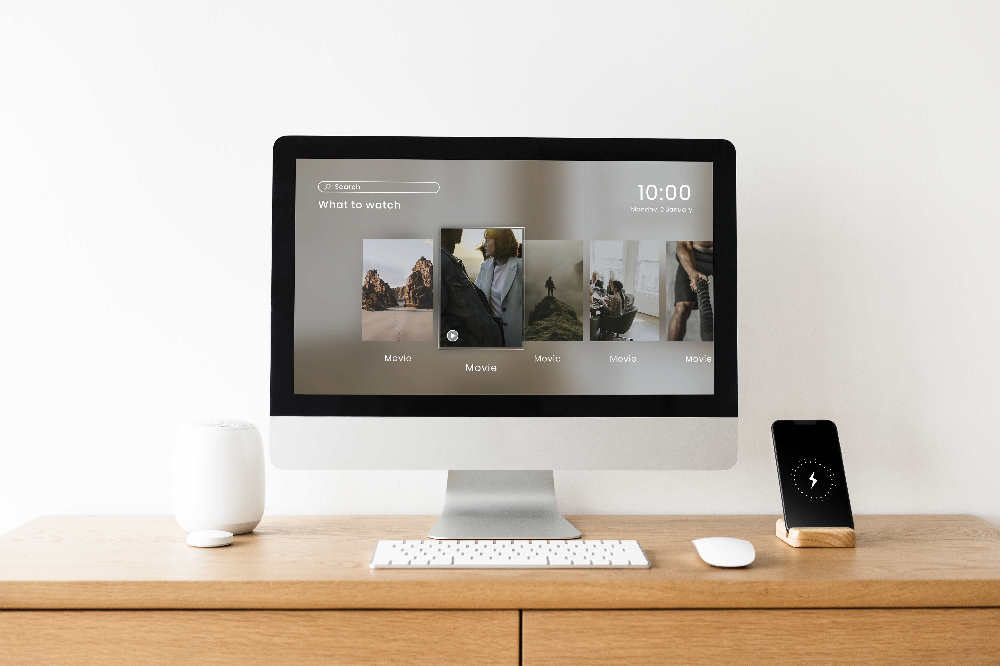

---
# **Recommender Systems**

---
Almost everything we buy or consume today is influenced by some form of recommendation; whether that's from friends, family, external reviews, and, more recently, from the sources selling you the product. When you log on to Netflix or Amazon Prime, for example, you will see a list of movies and television shows the service thinks you will like based on your past watching (and rating) history. Facebook suggests people it thinks you may know and would probably like to add. It also curates a News Feed for you based on the posts you've liked, the people you've be-friended, and the pages you've followed. Amazon recommends items to you as you browse for a particular product. It shows you similar products from a competing source and suggests auxiliary items frequently bought together with the product.


<a id="TOC"></a>
## **Table of Contents**
- [Introduction](#1)
  * [Types Of Recommender Systems](#2)
  * [Problem Statement](#3)
- [Connecting To Comet](#4)
- [Loading The Required Libraries](#5)
  * [Python Library Imports](#6)
  * [Importing the Datasets](#7)
- [Data](#8)
  * [Dataset Overview](#9)
  * [Additional Information](#10)
  * [Ratings Data File Structure](#11)
  * [Movies Data File Structure](#12)
- [Data Preprocessing](#13)
  * [Dataset Overview](#14)
  * [Data Types and Missing Values](#15)
  * [Checking for Missing Values](#16)
  * [Analysis of imdb_data](#17)
  * [Duplicates](#18)
  * [Merging of Datasets](#19)
- [Exploratory Data Analysis (EDA)](#20)
  * [Distribution of User Ratings](#21)
  * [Release-date insights](#22)
  * [Rating timestamp exploration](#23)
  * [Genre & Tag exploration](#24)
- [Recommender Choice](#25)
  * [Content Based](#26)
  * [Collaborative Filtering](#27)
  * [Similarity Measure](#28)
- [Predictive Modelling](#29)
  * [Splitting of Training and Validation Sets](#30)
  * [Setting up Algorithms for Model Training](#31)
  * [KNN Basic](#32)
  * [CoClustering](#33)
  * [Baseline Only](#34)
  * [Tuned BaselineOnly](#35)
  * [KNNWithMeans](#36)
  * [KNNWithZscore](#37)
  * [KNNBaseline](#38)
  * [Non-negative Matrix Factorization (NMF)](#39)
  * [Singular Value Decomposition](#40)
- [Hyperparameter Tuning of Best Model](#41)
  * [Comet Experiments Feedback](#42)
  * [End of Comet Experiments and Logs](#43)
  * [Submission Dataset](#44)
  * [Pickle File for Streamlit ](#45)
- [Conclusion](#46)
- [References](#47)

<a id="1"></a>
***
## **Introduction**



In recommender systems, as with almost every other machine learning problem, the techniques and models you use (and the success you enjoy) are heavily dependent on the quantity and quality of the data you possess. In this section, we will gain an overview of three of the most popular types of recommender systems in decreasing order of data they require to inorder function efficiently.


**Types of Recommender Systems**

In this section we will look at the most common types of recommender systems which are content-based and collaborative filtering.


- Collaborative filtering:

  Collaborative filtering leverages the power of community to provide recommendations. Collaborative filtering uses similarities between users and items simultaneously to provide recommendations. This allows for serendipitous recommendations; that is, collaborative filtering models can recommend an item to user A based on the interests of a similar user B. Furthermore, the embeddings can be learned automatically, without relying on hand-engineering of features.Collaborative filters are one of the most popular recommender models used in the industry and have found huge success for companies such as Amazon. 


- Content-based systems:

  Unlike Collaborative filters, Content-based systems do not require data relating to past activity. Instead, they provide recommendations based on a user profile and metadata it has on particular items. Netflix is an excellent example of the aforementioned system. The first time you sign in to Netflix, it doesn't know what your likes and dislikes are, so it is not in a position to find users similar to you and recommend the movies and shows they have liked. Netflix does instead is ask you to rate a few movies that you have watched before. Based on this information and the metadata it already has on movies, it creates a watchlist for you. For instance, if you enjoyed the Harry Potter and Narnia movies, the contentbased system can identify that you like movies based on fantasy novels and will recommend a movie such as Lord of the Rings to you.


- Hybrid Recommenders:

  Hybrid recommenders as the name suggests, are robust systems that combine various types of recommender models, including the ones we've already explained. As we've seen in previous sections, each model has its own set of advantages and disadvantages. Hybrid systems try to nullify the disadvantage of one model against an advantage of another.


**Problem Statement**

We have been challenged to construct a recommendation algorithm based on content or collaborative filtering, capable of accurately predicting how a user will rate a movie they have not yet viewed based on their historical preferences.

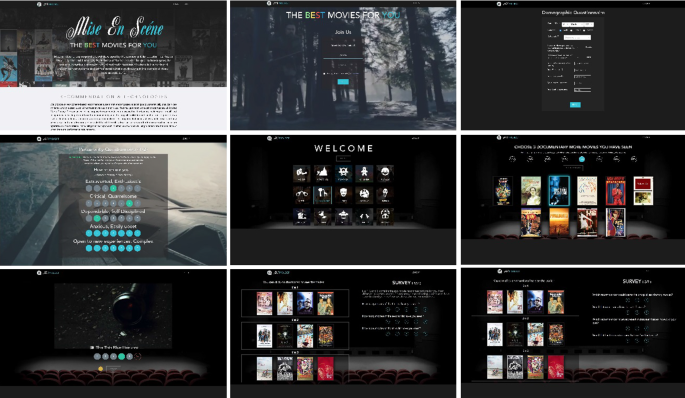





<a id="1"></a>
***
## **Connecting To Comet**




- Comet provides a self-hosted and cloud-based meta machine learning platform allowing data scientists and teams to track, compare, explain and optimize experiments and models.

- Backed by thousands of users and multiple Fortune 100 companies, Comet provides insights and data to build better, more accurate AI models while improving productivity, collaboration and visibility across teams.
- We will be using Comet to version control our experiments

---
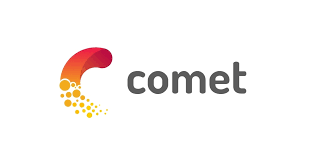

<a id="1"></a>
***
## **Loading Required Libraries**



In [ ]:
# importing the libraries
import numpy as np
import pandas as pd
import seaborn as sns
import math
import random
import pickle
import json
import matplotlib.pyplot as plt
import re
import warnings

from datetime import datetime
from scipy.sparse import csr_matrix
from sklearn.feature_extraction.text import TfidfVectorizer
from scipy.sparse.linalg import svds
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from wordcloud import WordCloud, STOPWORDS

# !pip install scikit-surprise
from surprise import Reader, Dataset
from surprise.model_selection import cross_validate
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from surprise import NormalPredictor
from surprise import SVDpp, SVD
from surprise import NMF
from surprise import KNNBasic, KNNWithMeans, KNNWithZScore, KNNBaseline
from surprise import BaselineOnly, SlopeOne, CoClustering
from surprise.accuracy import rmse
from surprise import accuracy
from surprise.model_selection import train_test_split
from surprise.model_selection import GridSearchCV

warnings.filterwarnings("ignore")
sns.set_style('dark')
%matplotlib inline

<a id="1"></a>
***
## **Data**


**Dataset Overview**

Dataset | Description
--- | ---
genome_scores |  The file genome-scores.csv contains movie-tag relevance data in the following format: movieId, tagId and relevance.
genome_tags | The second file, genome-tags.csv, provides the tag descriptions for the tag IDs in the genome file, in the following format: tagId, tag.
imdb_data | Additional movie metadata scraped from IMDB using the links.csv file.
links | File providing a mapping between a MovieLens ID and associated IMDB and TMDB IDs.
tags | User assigned for the movies within the dataset.
test | The test split of the dataset. Contains user and movie IDs with no rating data.
train | The training split of the dataset. Contains user and movie IDs with associated rating data.

**Additional Information**
- The below information is provided directly from the MovieLens dataset description files:

**Ratings Data File Structure (train.csv)**
- All ratings are contained in the file train.csv. Each line of this file after the header row represents one rating of one movie by one user, and has the following format:

    - userId
    - movieId
    - rating
    - timestamp

- The lines within this file are ordered first by userId, then, within user, by movieId.

- Ratings are made on a 5-star scale, with half-star increments (0.5 stars - 5.0 stars).

- Timestamps represent seconds since midnight Coordinated Universal Time (UTC) of January 1, 1970.



**Movies Data File Structure (movies.csv)**
- Movie information is contained in the file movies.csv. Each line of this file after the header row represents one movie, and has the following format:
    - movieId
    - title
    - genres

- Genres are a pipe-separated list, and are selected from the following:
    - Action
    - Adventure
    - Animation
    - Children's
    - Comedy
    - Crime
    - Documentary
    - Drama
    - Fantasy
    - Film-Noir
    - Horror
    - Musical
    - Mystery
    - Romance
    - Sci-Fi
    - Thriller
    - War
    - Western
    (no genres listed)


In [ ]:
%%time
# Loading datasets

train = pd.read_csv('../input/edsa-recommender-system-predict/train.csv')
test = pd.read_csv('../input/edsa-recommender-system-predict/test.csv')
genome_scores = pd.read_csv('../input/edsa-recommender-system-predict/genome_scores.csv')
genome_tags = pd.read_csv('../input/edsa-recommender-system-predict/genome_tags.csv')
imdb_data = pd.read_csv('../input/edsa-recommender-system-predict/imdb_data.csv')
links = pd.read_csv('../input/edsa-recommender-system-predict/links.csv')
movies = pd.read_csv('../input/edsa-recommender-system-predict/movies.csv')
tags= pd.read_csv('../input/edsa-recommender-system-predict/tags.csv')
movies_cb = movies.copy()

<a id="1"></a>
***
## **Data Preprocessing**
***